<a href="https://colab.research.google.com/github/sanu1230/Academic-Project/blob/master/EDA_v_2_NYC_Flight_Data_Analysis_for_the_year_2013.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EDA v.2 : NYC Flight Data Analysis for the year 2013

# Introduction to Data

The data provides information about the NYC flights for the entire year of  2013. With the help of which, we are be able analyze many different aspects of flights departing and arriving to New York city’s all three airports(EWR, JFK & LGA). 

Moreover, number of flights on-time and delayed, departed and arrived, month wise and their percentages etc.


# Attributes

- year, month, day are dates 
- hour, minute are hours and minutes of arrival or departure 
- time_hours is date and time together
- dep_time is flight departure time
- sched_dep_time is scheduled time for fight departure
- dep_delay departure delay
- arr_time is flight arrival time
- sched_arr_time is scheduled time for flight arrival
- arr_delay arrival delay
- carrier is carrier code
- flight is flight number
- tailnum is flight tail number
- origin is flight departure airport code
- dest is flight arrival airport code
- air_time total time to reach dest (flight flying time)
- distance - total distance covered in one flight

In [ ]:
!pip -q install pandas_profiling==2.5.0

In [ ]:
!pip freeze | grep pandas

pandas==0.25.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==2.5.0
sklearn-pandas==1.8.0


In [ ]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import time
import dask.dataframe as dd
import pandas_profiling
from IPython.display import HTML, display, IFrame


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Loading Data

In [ ]:
fd = pd.read_csv('/content/drive/My Drive/Colab Notebooks/EDA/Project Datasets/attachment_Project_1_NYC-Flight_data/Project_1_NYC-Flight data/flight_data.csv')
fd.head()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400,5,15,01-01-2013 05:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416,5,29,01-01-2013 05:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089,5,40,01-01-2013 05:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576,5,45,01-01-2013 05:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762,6,0,01-01-2013 06:00


In [ ]:
fd.describe()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
count,336776.0,336776.000000,336776.000000,328521.000000,336776.000000,328521.000000,328063.000000,336776.000000,327346.000000,336776.000000,327346.000000,336776.000000,336776.000000,336776.000000
mean,2013.0,6.548510,15.710787,1349.109947,1344.254840,12.639070,1502.054999,1536.380220,6.895377,1971.923620,150.686460,1039.912604,13.180247,26.230100
std,0.0,3.414457,8.768607,488.281791,467.335756,40.210061,533.264132,497.457142,44.633292,1632.471938,93.688305,733.233033,4.661316,19.300846
min,2013.0,1.000000,1.000000,1.000000,106.000000,-43.000000,1.000000,1.000000,-86.000000,1.000000,20.000000,17.000000,1.000000,0.000000
25%,2013.0,4.000000,8.000000,907.000000,906.000000,-5.000000,1104.000000,1124.000000,-17.000000,553.000000,82.000000,502.000000,9.000000,8.000000
50%,2013.0,7.000000,16.000000,1401.000000,1359.000000,-2.000000,1535.000000,1556.000000,-5.000000,1496.000000,129.000000,872.000000,13.000000,29.000000
75%,2013.0,10.000000,23.000000,1744.000000,1729.000000,11.000000,1940.000000,1945.000000,14.000000,3465.000000,192.000000,1389.000000,17.000000,44.000000
max,2013.0,12.000000,31.000000,2400.000000,2359.000000,1301.000000,2400.000000,2359.000000,1272.000000,8500.000000,695.000000,4983.000000,23.000000,59.000000


# Feature Engineering

In [ ]:
#@title Lets create a 'Months_desc' feature

In [ ]:
# Month name: Creating a dictionary of months names and numbers

month_dict={
    1:  '01- January',
    2:  '02- February',
    3:  '03- March',
    4:  '04- April',
    5:  '05- May',
    6:  '06- June',
    7:  '07- July',
    8:  '08- August',
    9:  '09- September',
    10: '10- October',
    11: '11- November',
    12: '12- December'
}
fd['Month_desc'] = fd['month'].apply(lambda m: month_dict[m])

fd.head()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour,Month_desc
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400,5,15,01-01-2013 05:00,01- January
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416,5,29,01-01-2013 05:00,01- January
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089,5,40,01-01-2013 05:00,01- January
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576,5,45,01-01-2013 05:00,01- January
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762,6,0,01-01-2013 06:00,01- January


In [ ]:
#@title Lets create Time feature

In [ ]:
fd['Time']= pd.to_datetime(fd['hour'].astype(str) + ':' + fd['minute'].astype(str), format= '%H:%M').dt.time
fd['Time']

0         05:15:00
1         05:29:00
2         05:40:00
3         05:45:00
4         06:00:00
            ...   
336771    14:55:00
336772    22:00:00
336773    12:10:00
336774    11:59:00
336775    08:40:00
Name: Time, Length: 336776, dtype: object

In [ ]:
fd.shape

(336776, 21)

In [ ]:
fd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 336776 entries, 0 to 336775
Data columns (total 21 columns):
year              336776 non-null int64
month             336776 non-null int64
day               336776 non-null int64
dep_time          328521 non-null float64
sched_dep_time    336776 non-null int64
dep_delay         328521 non-null float64
arr_time          328063 non-null float64
sched_arr_time    336776 non-null int64
arr_delay         327346 non-null float64
carrier           336776 non-null object
flight            336776 non-null int64
tailnum           334264 non-null object
origin            336776 non-null object
dest              336776 non-null object
air_time          327346 non-null float64
distance          336776 non-null int64
hour              336776 non-null int64
minute            336776 non-null int64
time_hour         336776 non-null object
Month_desc        336776 non-null object
Time              336776 non-null object
dtypes: float64(5), int64(9), ob

## Drop unnecessary columns

In [ ]:
'''Lets drop unnecessay columns like time_hour, hour and minute cause time_hour has date and hour
and we have date in the form of year, month date and Time for hour and minute '''

fd = fd.drop(['time_hour'], 1)
fd.head()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,Month_desc,Time
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400,5,15,01- January,05:15:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416,5,29,01- January,05:29:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089,5,40,01- January,05:40:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576,5,45,01- January,05:45:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762,6,0,01- January,06:00:00


## Pandas profiling

In [ ]:
report = pandas_profiling.ProfileReport(fd)
report.to_file('nyc_flight.html')

In [ ]:
display(HTML(open('nyc_flight.html').read()))

Number of variables,20
Number of observations,336776
Missing cells,46595
Missing cells (%),0.7%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,150.6 MiB
Average record size in memory,468.9 B
NUM,13
CAT,7
Analysis started,2020-07-04 09:03:35.092852


In [ ]:
#@title Save 1
fd1 =fd.copy()

In [ ]:
#@title Restore Save 1
fd =fd1.copy()

## Finding missing values

In [ ]:
fd.head()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,Month_desc,Time
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400,5,15,01- January,05:15:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416,5,29,01- January,05:29:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089,5,40,01- January,05:40:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576,5,45,01- January,05:45:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762,6,0,01- January,06:00:00


In [ ]:
fd.isna().sum()

year                 0
month                0
day                  0
dep_time          8255
sched_dep_time       0
dep_delay         8255
arr_time          8713
sched_arr_time       0
arr_delay         9430
carrier              0
flight               0
tailnum           2512
origin               0
dest                 0
air_time          9430
distance             0
hour                 0
minute               0
Month_desc           0
Time                 0
dtype: int64

In [ ]:
#Missing Values

# dep_time & arr_time can be filled based on origin dept_time & dest arr_time mode
# dep_delay & arr_delay can be filled with avg delay
# tailnum has around 4k distinct count hence can be filled with flight orign tailnum mode 
# air_time can be filled based on similar origin and dest of flight

## Filling missing value

In [ ]:
# For dep_time 

origin1 = fd.origin[fd.dep_time.isna()].mode() # Find the mode of origin filtered based on for missing dep_time
print('Mode of origin based on missing dep_time', origin1[0])

dep_time_org_mode = fd.dep_time[fd['origin'] == origin1[0]].mode() # find dep_time mode() filtered based on above finding origin1
print('Mode of dep_time based on origin as origin1[0]', dep_time_org_mode[0])

fd['dep_time'] = fd.dep_time.fillna(dep_time_org_mode[0]) # Filling missing value



# For arr_time

dest1 = fd.dest[fd.arr_time.isna()].mode() # Find the mode of dest filtered based on for missing arr_time
print('Mode of dest based on missing arr_time', dest1[0])

arr_time_dest_mode = fd.arr_time[fd['dest'] == dest1[0]].mode() # find arr_time mode() filtered based on above finding dest1
print('Mode of arr_time based on dest as dest1[0]', arr_time_dest_mode[0])

fd['arr_time'] = fd.arr_time.fillna(arr_time_dest_mode[0])  # Filling missing value



Mode of origin based on missing dep_time EWR
Mode of dep_time based on origin as origin1[0] 628.0
Mode of dest based on missing arr_time ORD
Mode of arr_time based on dest as dest1[0] 906.0


In [ ]:
# For dep_delay & arr_delay

fd['dep_delay'] = fd.dep_delay.fillna(fd['dep_delay'].mean())
fd['arr_delay'] = fd.arr_delay.fillna(fd['arr_delay'].mean())


In [ ]:
# For tailnum 
# Lets find out how many missing tailnum have what origin and dest
# Lets make a new feaute 'org_dest' with the combination of 'origin' and 'dest' 

fd['org_dest'] = fd['origin'] + '-'+ fd['dest'] # Lets combine origin and dest
org_dest_unq = fd['org_dest'].unique() # find find uniques combination of org and dest
org_dest_unq = list(org_dest_unq) # convert the unique combo to list

# Lets use for loop to fill diff na values for tailnum based on its org and dest
for x in org_dest_unq:
  if any(fd.org_dest == x):
    fd['tailnum'] = fd.tailnum.fillna(fd.tailnum[fd['org_dest'] == x].mode()[0])


In [ ]:
# For air_time
# Now all the flights that travel from one same origin & dest should take same airtime
# So lets fill the na's with same air_time for each missing value based on org_dest

for x in org_dest_unq:
  if any(fd.org_dest == x):
    fd['air_time'] = fd.air_time.fillna(fd.air_time[fd['org_dest'] == x].values[0])



In [ ]:
#Lets Check if any more NaN values
fd.isna().sum()

year              0
month             0
day               0
dep_time          0
sched_dep_time    0
dep_delay         0
arr_time          0
sched_arr_time    0
arr_delay         0
carrier           0
flight            0
tailnum           0
origin            0
dest              0
air_time          0
distance          0
hour              0
minute            0
Month_desc        0
Time              0
org_dest          0
dtype: int64

In [ ]:
# Now the data is changed and we do not have any missing values

In [ ]:
#@title Save 2
fd2 = fd.copy()

In [ ]:
#@title Restore 2
fd = fd2.copy()

In [ ]:
fd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 336776 entries, 0 to 336775
Data columns (total 21 columns):
year              336776 non-null int64
month             336776 non-null int64
day               336776 non-null int64
dep_time          336776 non-null float64
sched_dep_time    336776 non-null int64
dep_delay         336776 non-null float64
arr_time          336776 non-null float64
sched_arr_time    336776 non-null int64
arr_delay         336776 non-null float64
carrier           336776 non-null object
flight            336776 non-null int64
tailnum           336776 non-null object
origin            336776 non-null object
dest              336776 non-null object
air_time          336776 non-null float64
distance          336776 non-null int64
hour              336776 non-null int64
minute            336776 non-null int64
Month_desc        336776 non-null object
Time              336776 non-null object
org_dest          336776 non-null object
dtypes: float64(5), int64(9), ob

## Display Visuals

### Monthly Average Departure Delay



In [ ]:
# Filtered the data by groupping months and then aggregating with mean of departure delay for that month
monthly_delay = fd.groupby(['Month_desc'], as_index=False).agg({'dep_delay': 'mean'})

# Filtered the dep_delay column from monthly_delay and rounded the values 
monthly_delay['dep_delay']=np.round(monthly_delay['dep_delay'],0)
print(monthly_delay)



       Month_desc  dep_delay
0     01- January       10.0
1    02- February       11.0
2       03- March       13.0
3       04- April       14.0
4         05- May       13.0
5        06- June       21.0
6        07- July       21.0
7      08- August       13.0
8   09- September        7.0
9     10- October        6.0
10   11- November        5.0
11   12- December       16.0


In [ ]:
px.scatter(monthly_delay, x='Month_desc', y='dep_delay', size='dep_delay', color='Month_desc', hover_name='dep_delay', size_max=25,
                title= "Monthly Average Departure Delay", labels={'Month_desc': 'Months', 'dep_delay': 'Departure Delay'}
           ).update(layout=dict(title=dict(x=0.5)))

### Best airports in terms of on time departure %

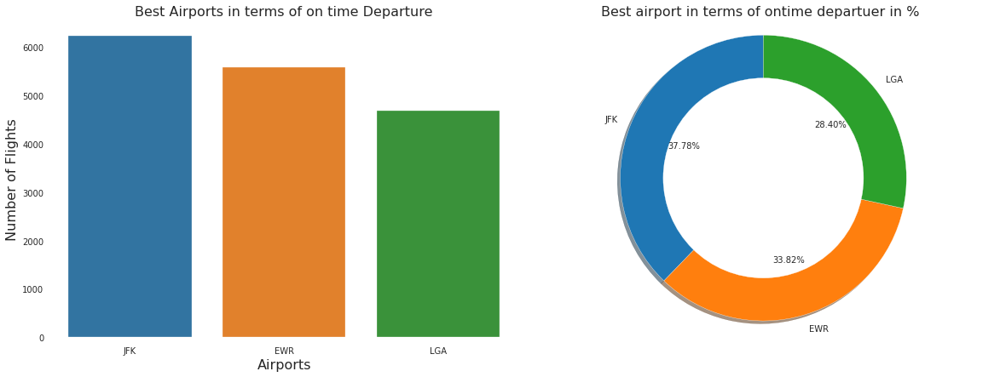

The above analysis shows that the best airport in terms of ontime departure % is JFk with 37.78% flights on time.


In [ ]:
# Filter new dataframe which has dep_delay == 0
fd1 = fd[fd['dep_delay']==0]

# Creating Circle plot 
f, ax = plt.subplots(1, 2, figsize=(16,6))
fd1['origin'].value_counts().plot.pie(startangle=90, shadow=True, autopct='%1.2f%%')
center_circle = plt.Circle((0,0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)
ax[1].axis('equal')  
ax[1].set_title("Best airport in terms of ontime departuer in % ", fontsize = 16)
ax[1].set_ylabel("")
plt.tight_layout()

# Creating bar plot
sns.countplot('origin', order = fd1['origin'].value_counts().index, data=fd1, ax=ax[0])
ax[0].set_title("Best Airports in terms of on time Departure", fontsize = 16)
ax[0].set_ylabel("Number of Flights", fontsize = 16)
ax[0].set_xlabel("Airports", fontsize = 16)

plt.show()

print("The above analysis shows that the best airport in terms of ontime departure % is JFk with 37.78% flights on time.")

### Aircraft Speed Analysis

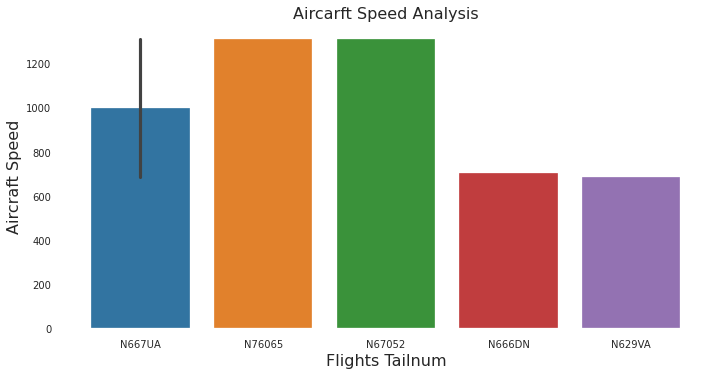

In [ ]:
# Top 10 fastest flights details from NYC
fd['f_speed']=fd['distance']/(fd['air_time']/60)
fd2 = fd.sort_values(by='f_speed', ascending=False).head(10)

sns.catplot(x = 'tailnum', y='f_speed', data = fd2, kind='bar', height=5, aspect=2)
plt.title("Aircarft Speed Analysis", fontsize = 16)
plt.ylabel("Aircraft Speed", fontsize = 16)
plt.xlabel("Flights Tailnum", fontsize = 16)
plt.plot()
plt.show()

### On time arrival % analysis

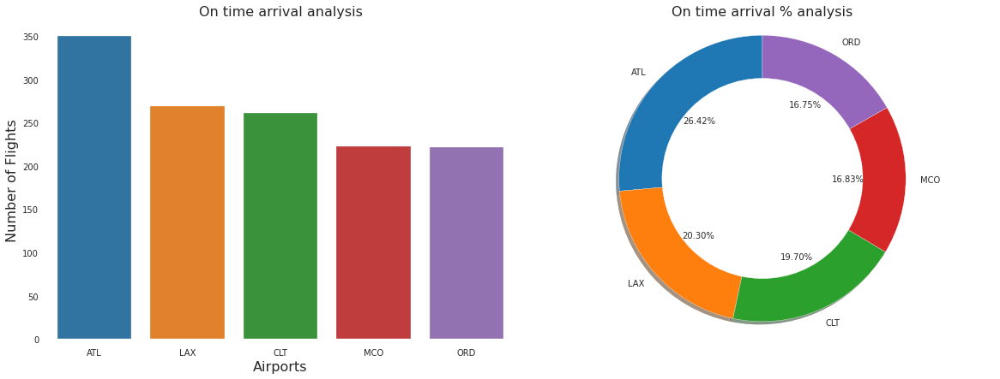

In [ ]:
# Filter new dataframe which has dep_delay == 0
fd3 = fd[fd['arr_delay']==0]
dest_c =  fd3['dest'].value_counts().head(5)

# Creating Circle plot 
f, ax = plt.subplots(1, 2, figsize=(16,6))
dest_c.plot.pie(startangle=90, shadow=True, autopct='%1.2f%%')
center_circle = plt.Circle((0,0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)
ax[1].axis('equal')  
ax[1].set_title("On time arrival % analysis", fontsize = 16)
ax[1].set_ylabel("")
plt.tight_layout()

# Creating bar plot
sns.countplot('dest', order = dest_c.index, data=fd3, ax=ax[0])
ax[0].set_title("On time arrival analysis", fontsize = 16)
ax[0].set_ylabel("Number of Flights", fontsize = 16)
ax[0].set_xlabel("Airports", fontsize = 16)

plt.show()

### Maximum number of flights headed to some particular destination.

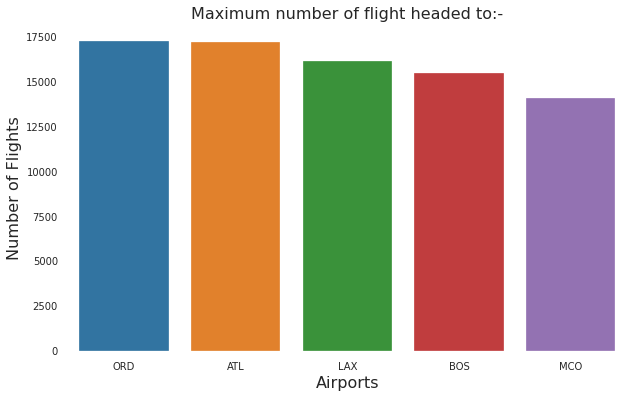

The above graph shows that the maximum number of flights are headed to ATL airport


In [ ]:
# Taking count of each destination to get which destination has maximum numbers, and then just picking first five.
dest_count = fd['dest'].value_counts().head(5) 
f, ax = plt.subplots(figsize=(10, 6))
sns.countplot('dest', order = dest_count.index, data = fd)
ax.set_title("Maximum number of flight headed to:-", fontsize = 16)
ax.set_ylabel("Number of Flights", fontsize = 16)
ax.set_xlabel("Airports", fontsize = 16)

plt.show()

print("The above graph shows that the maximum number of flights are headed to ATL airport")



---


### Average departure delay by carrier in 2013



---


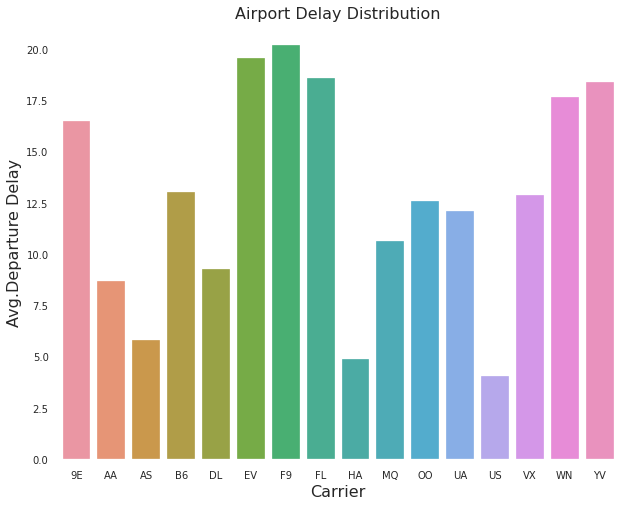

In [ ]:
# Creating bar plot 

dep_delayed_flights = fd.groupby(['carrier'], as_index=False).agg({'dep_delay': 'mean'})

f,ax = plt.subplots(figsize=(10, 8))
sns.barplot('carrier','dep_delay', data=dep_delayed_flights ,ax=ax)
ax.set_title('Airport Delay Distribution', fontsize=16)
ax.set_ylabel("Avg.Departure Delay", fontsize=16)
ax.set_xlabel("Carrier", fontsize=16)
plt.close(2)
plt.show()

### Average arrival delay by carrier in 2013

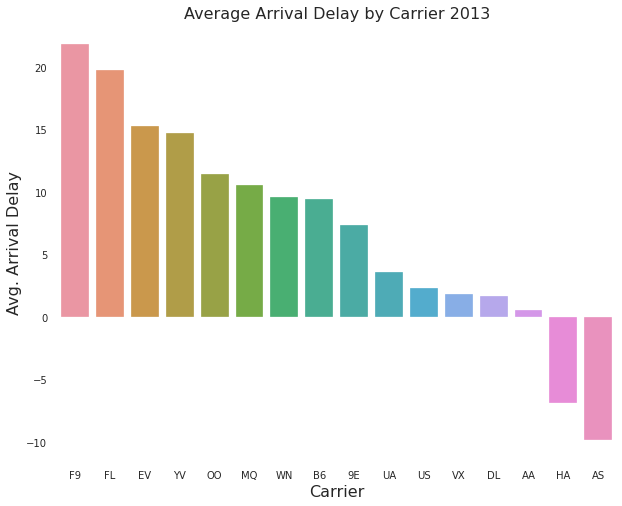

In [ ]:
#Average arrival delay by carrier in 2013 (Including early arrival)

arr_delayed_flights = fd.groupby(fd['carrier'], as_index=False).agg({'arr_delay' : 'mean'})

f, ax =plt.subplots(1,1, figsize=(10,8))
sns.barplot('carrier', 'arr_delay', data=arr_delayed_flights, 
            order=['F9', 'FL', 'EV', 'YV','OO','MQ','WN','B6', '9E','UA', 'US','VX','DL', 'AA','HA','AS'])
ax.set_title('Average Arrival Delay by Carrier 2013', fontsize=16)
ax.set_xlabel('Carrier', fontsize=16)
ax.set_ylabel('Avg. Arrival Delay', fontsize=16)
plt.close(2)
plt.show()

###  The day and month having highest number of flight delay


In [ ]:
# The day and month having highest number of flight delay

max_flightdelay_day = fd[fd['dep_delay'] > 0].groupby(['day', 'month'], as_index=False).agg({'flight': 'count'})

max_flightdelay_info = max_flightdelay_day[max_flightdelay_day['flight'].max() == max_flightdelay_day['flight']]
max_flightdelay_info

,day,month,flight
86,8,3,833


## Carrier heatmap

In [ ]:
Carrier_hmap = fd.drop(['dep_time','sched_dep_time','arr_time','sched_arr_time','hour','minute', 
                                   'month','year','origin','dest','tailnum', 'Time', 'org_dest', 
                                   'distance','flight','air_time'], axis=1)

Carrier_hmap.head()

,day,dep_delay,arr_delay,carrier,Month_desc,f_speed
0,1,2.0,11.0,UA,01- January,370.044053
1,1,4.0,20.0,UA,01- January,374.273128
2,1,2.0,33.0,AA,01- January,408.375000
3,1,-1.0,-18.0,B6,01- January,516.721311
4,1,-6.0,-25.0,DL,01- January,394.137931


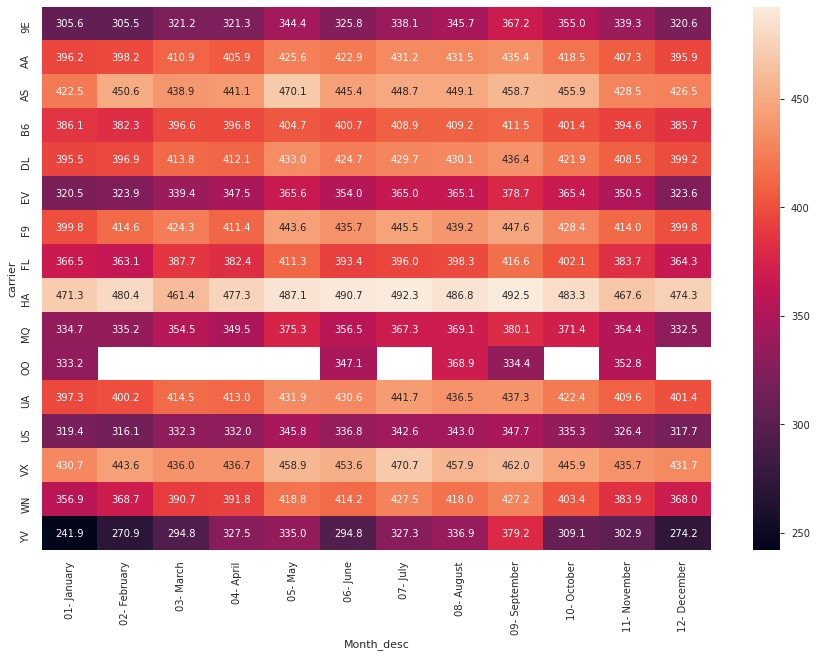

In [ ]:
Carrier_hmap_OO = pd.pivot_table(Carrier_hmap, values='f_speed', aggfunc='mean', index='carrier', columns='Month_desc')
Carrier_hmap_OO.head()

plt.figure(figsize=(15,10))
sns.heatmap(Carrier_hmap_OO, annot=True, fmt=".1f")
plt.show()


## Peak season for air travel in USA

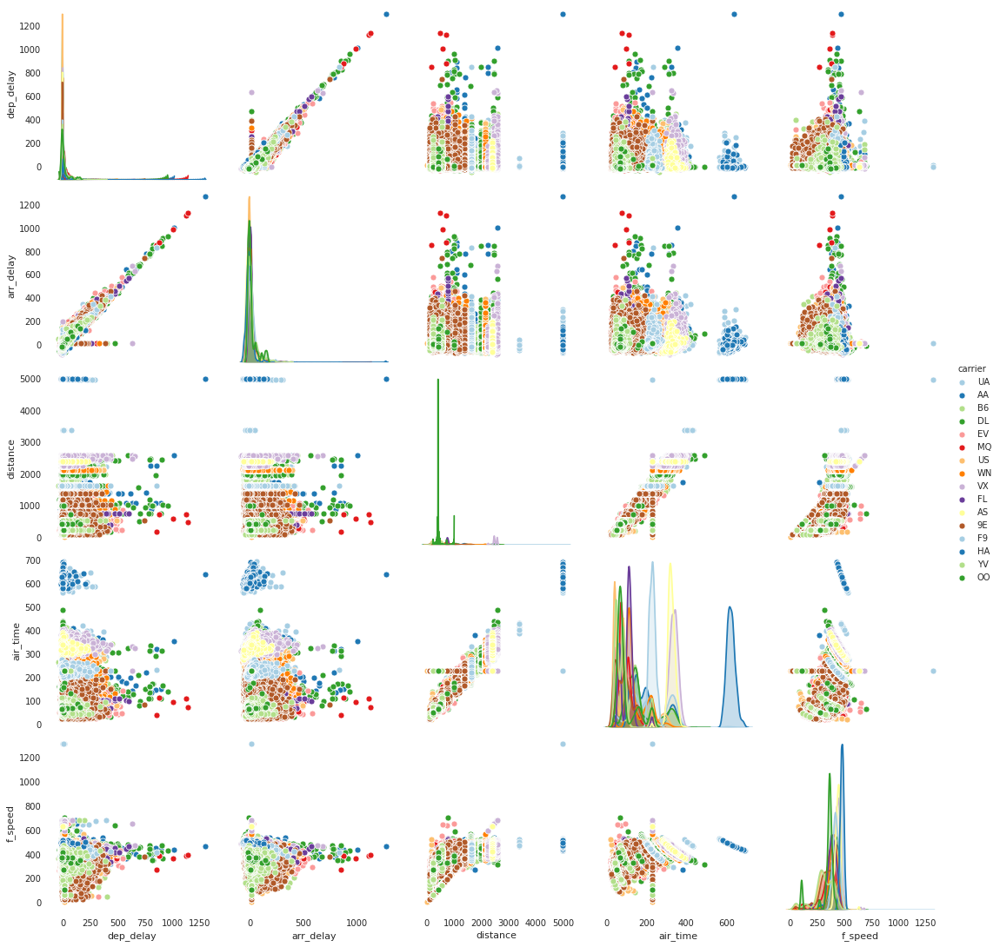

In [ ]:
Airlines_info= sns.pairplot(fd, height=3,
                            vars=['dep_delay', 'arr_delay', 'distance', 'air_time', 'f_speed'], hue='carrier', palette="Paired")
plt.show(Airlines_info)

## Correlation map

In [ ]:
fd.columns

Index(['year', 'month', 'day', 'dep_time', 'sched_dep_time', 'dep_delay',
       'arr_time', 'sched_arr_time', 'arr_delay', 'carrier', 'flight',
       'tailnum', 'origin', 'dest', 'air_time', 'distance', 'hour', 'minute',
       'Month_desc', 'Time', 'org_dest', 'f_speed'],
      dtype='object')

In [ ]:
flight_data = fd.drop(['year', 'dep_time', 'sched_dep_time', 'arr_time', 'sched_arr_time', 'carrier', 'flight', 
                       'tailnum', 'origin', 'dest', 'air_time', 'hour', 'minute', 'Month_desc', 'Time', 'org_dest'], axis=1)
flight_data

,month,day,dep_delay,arr_delay,distance,f_speed
119816,2,10,12.63907,6.895377,4963,1311.806167
277873,7,29,12.63907,6.895377,4963,1311.806167
256125,7,7,-2.00000,6.895377,4963,1311.806167
178755,4,15,8.00000,6.895377,4963,1311.806167
332671,9,26,2.00000,6.895377,4963,1311.806167
251860,7,2,11.00000,6.895377,4963,1311.806167
216447,5,25,9.00000,-14.000000,762,703.384615
42948,10,17,12.63907,6.895377,2586,683.524229
87718,12,5,-1.00000,6.895377,2586,683.524229
118946,2,9,12.63907,6.895377,2586,683.524229


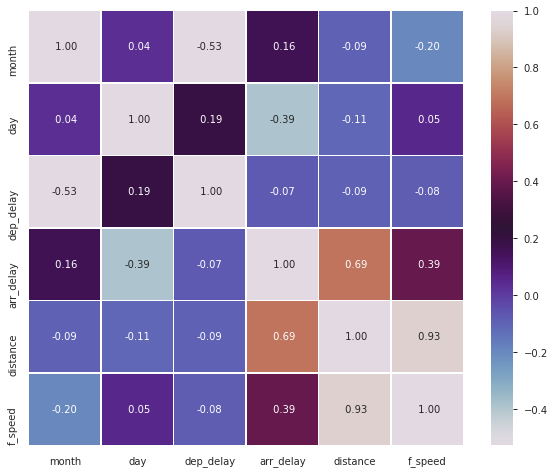

In [ ]:

fd_corr = flight_data.corr()

f, ax = plt.subplots(figsize=(10,8))

sns.heatmap(fd_corr, square=True, cmap='twilight', linewidths= 0.7, annot=True, fmt=' .2f')
plt.show()

## Conclusion :

The data provides information related to each flights departure & arrival time and its delay, its origin and the destination, each flights identity, the dates, flight hours and distance. However, it doesnt provide reasons for the delay, which could be many important factors such as flight diverson, chocks on and off timing, fuel consumption, etc. Hence, we do not get a clear understanding of delay, which could had been a supportive data to look into delay issues and come up with delay reduction steps.

Based on the current data, a solution that can help reduce the delays of flights; is to fly with increased speed, which will atleast ensure  on-time arrival. This may effect as a chain reaction with flights taking off and landing timings effecting other scheduled flights to run on time. Which in turn will help reduce the cost to ariline industry, benefiting passangers and related businesses



---

#       -----------------------------------------------------------------THE END -------------------------------------------------------------

---

